# Model Evaluation

In [5]:
import os
import random
import glob
import cv2
import matplotlib.pyplot as plt

!pip install -U -q ultralytics
from ultralytics import YOLO

In [6]:
os.chdir('../')

## 1. 10% Data from 5 Classes

In [17]:
# Writing a function to predict and visualize
def predict_and_visualize(model_path: str, test_dirpath: str, conf: float):
    """
    """
    # Getting the list of all the images in the directory
    imgs_list = glob.glob(os.path.join(test_dirpath, '*/*'))
    
    # Getting a random sample from the images list
    rand_imgs = random.sample(imgs_list, 10)
    
    # Loading the model
    model = YOLO(model_path)
    
    # Predicting and visualizing the random images
    plt.figure(figsize=(25, 12))
    for i in range(10):
        plt.subplot(2, 5, i+1)
        
        # Reading the random images
        img = cv2.imread(rand_imgs[i])
        
        # Predicting the images and plotting it
        results = model.predict(img, conf=conf)
        pred_plot = results[0].plot()
        plot = cv2.cvtColor(pred_plot, cv2.COLOR_BGR2RGB)
        plt.imshow(plot)
        plt.axis(False);

### Experiment No. 1 - Yolov8 Nano Model

#### Best Model Results

In [8]:
exp1_best_model_path = 'train_logs_5class_10percent/exp1_yolov8n_5class_10percent/weights/best.pt'
val_imgs_path = 'datasets/images/val'

In [9]:
# Validating the best model on the val dataset for this experiment
model = YOLO(exp1_best_model_path)
metrics = model.val(name='exp1_best_model')

Ultralytics YOLOv8.0.92 🚀 Python-3.9.16 torch-1.12.1+cu116 CUDA:0 (Quadro P5000, 16279MiB)
YOLOv8n-seg summary (fused): 195 layers, 3259039 parameters, 0 gradients, 12.0 GFLOPs
val: Scanning /notebooks/datasets/labels/val/chicken_curry.cache... 121 images, 0 backgrounds, 0 corrupt: 100%|██████████| 121/121 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.84it/s]
                   all        121        122       0.84      0.829      0.913      0.724      0.831      0.821      0.897      0.698
         chicken_curry        121         24          1      0.575      0.901      0.713          1      0.576      0.886       0.69
        chocolate_cake        121         24      0.909      0.828      0.896      0.645      0.863      0.788      0.824        0.6
             hamburger        121         23      0.658      0.783      0.811      0.562      0.


0: 512x512 1 pizza, 11.0ms
Speed: 1.2ms preprocess, 11.0ms inference, 2.1ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 1 hamburger, 11.6ms
Speed: 1.3ms preprocess, 11.6ms inference, 2.2ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 1 pizza, 11.5ms
Speed: 1.3ms preprocess, 11.5ms inference, 2.2ms postprocess per image at shape (1, 3, 512, 512)

0: 384x512 1 hamburger, 13.5ms
Speed: 1.1ms preprocess, 13.5ms inference, 2.8ms postprocess per image at shape (1, 3, 512, 512)

0: 352x512 1 pizza, 12.9ms
Speed: 1.1ms preprocess, 12.9ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 512)

0: 384x512 1 ramen, 15.4ms
Speed: 1.3ms preprocess, 15.4ms inference, 3.0ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 1 hamburger, 13.9ms
Speed: 1.4ms preprocess, 13.9ms inference, 2.2ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 1 chicken_curry, 12.3ms
Speed: 1.3ms preprocess, 12.3ms inference, 2.0ms postprocess per image at sha

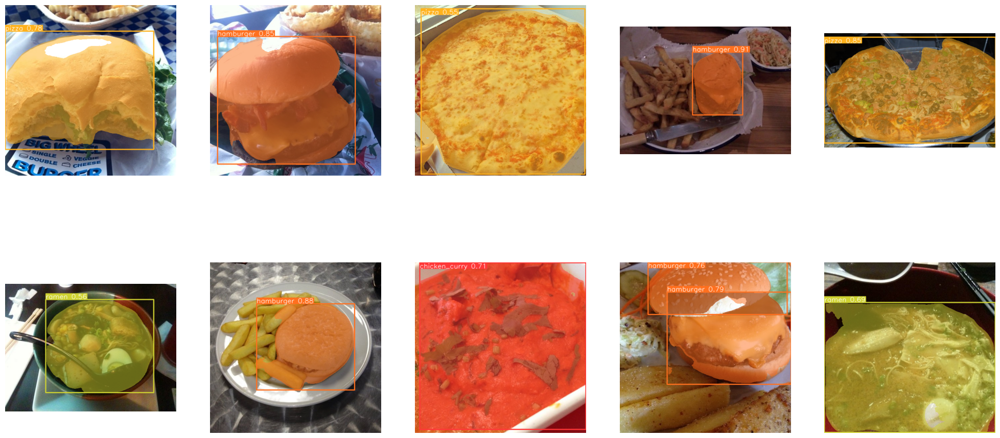

In [18]:
# Predicting and visualizing the model
predict_and_visualize(model_path=exp1_best_model_path,
                      test_dirpath=val_imgs_path,
                      conf=0.5)

#### Last Model Results

In [11]:
exp1_last_model_path = 'train_logs_5class_10percent/exp1_yolov8n_5class_10percent/weights/last.pt'

In [12]:
# Validating the best model on the val dataset for this experiment
model = YOLO(exp1_last_model_path)
metrics = model.val(name='exp1_last_model')

Ultralytics YOLOv8.0.92 🚀 Python-3.9.16 torch-1.12.1+cu116 CUDA:0 (Quadro P5000, 16279MiB)
YOLOv8n-seg summary (fused): 195 layers, 3259039 parameters, 0 gradients, 12.0 GFLOPs
val: Scanning /notebooks/datasets/labels/val/chicken_curry.cache... 121 images, 0 backgrounds, 0 corrupt: 100%|██████████| 121/121 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.02it/s]
                   all        121        122      0.852      0.879      0.911       0.71      0.833      0.863      0.898      0.686
         chicken_curry        121         24      0.729      0.833      0.875      0.634      0.729      0.833      0.875      0.602
        chocolate_cake        121         24      0.912      0.864      0.913      0.714      0.868      0.825       0.88      0.649
             hamburger        121         23      0.911      0.783      0.921      0.591      0.


0: 512x512 1 chocolate_cake, 11.2ms
Speed: 1.2ms preprocess, 11.2ms inference, 2.1ms postprocess per image at shape (1, 3, 512, 512)

0: 384x512 1 ramen, 14.5ms
Speed: 1.0ms preprocess, 14.5ms inference, 2.1ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 1 chicken_curry, 11.8ms
Speed: 1.0ms preprocess, 11.8ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 512)

0: 384x512 1 hamburger, 18.3ms
Speed: 1.0ms preprocess, 18.3ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 1 ramen, 20.4ms
Speed: 1.8ms preprocess, 20.4ms inference, 2.5ms postprocess per image at shape (1, 3, 512, 512)

0: 384x512 1 pizza, 13.5ms
Speed: 1.3ms preprocess, 13.5ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 512)

0: 384x512 (no detections), 16.6ms
Speed: 1.6ms preprocess, 16.6ms inference, 0.7ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 1 pizza, 13.1ms
Speed: 1.5ms preprocess, 13.1ms inference, 2.4ms postprocess per ima

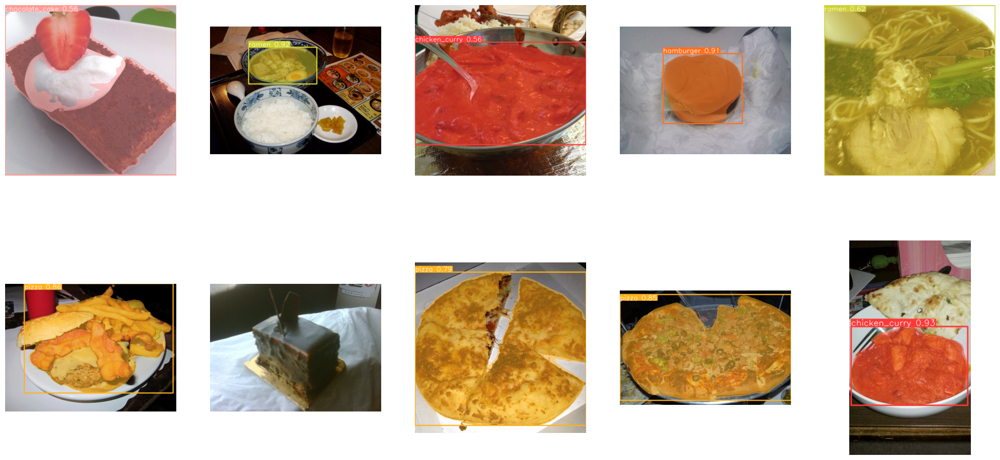

In [19]:
# Predicting and visualizing the model
predict_and_visualize(model_path=exp1_last_model_path,
                      test_dirpath=val_imgs_path,
                      conf=0.5)

### Experiment No. 2 - Yolov8 Small Model

#### Best Model Results

In [20]:
exp2_best_model_path = 'train_logs_5class_10percent/exp2_yolov8s_5class_10percent/weights/best.pt'

In [21]:
# Validating the best model on the val dataset for this experiment
model = YOLO(exp2_best_model_path)
metrics = model.val(name='exp2_best_model')

Ultralytics YOLOv8.0.92 🚀 Python-3.9.16 torch-1.12.1+cu116 CUDA:0 (Quadro P5000, 16279MiB)
YOLOv8s-seg summary (fused): 195 layers, 11781535 parameters, 0 gradients, 42.4 GFLOPs
val: Scanning /notebooks/datasets/labels/val/chicken_curry.cache... 121 images, 0 backgrounds, 0 corrupt: 100%|██████████| 121/121 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.85it/s]
                   all        121        122      0.872      0.893      0.944      0.775      0.853      0.868      0.926      0.743
         chicken_curry        121         24      0.675          1      0.948      0.737      0.618      0.917      0.885        0.7
        chocolate_cake        121         24      0.844      0.917      0.944      0.754      0.805      0.875      0.917      0.701
             hamburger        121         23      0.947      0.775      0.898      0.658      0


0: 512x512 1 hamburger, 10.9ms
Speed: 1.5ms preprocess, 10.9ms inference, 2.2ms postprocess per image at shape (1, 3, 512, 512)

0: 384x512 1 chicken_curry, 1 pizza, 19.8ms
Speed: 1.0ms preprocess, 19.8ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 1 chocolate_cake, 14.3ms
Speed: 1.4ms preprocess, 14.3ms inference, 2.1ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 1 hamburger, 13.8ms
Speed: 2.1ms preprocess, 13.8ms inference, 2.9ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 1 pizza, 12.0ms
Speed: 1.3ms preprocess, 12.0ms inference, 2.1ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 2 chocolate_cakes, 12.6ms
Speed: 1.8ms preprocess, 12.6ms inference, 2.3ms postprocess per image at shape (1, 3, 512, 512)

0: 384x512 1 ramen, 14.9ms
Speed: 1.4ms preprocess, 14.9ms inference, 2.5ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 (no detections), 13.0ms
Speed: 1.6ms preprocess, 13.0ms inference, 0.

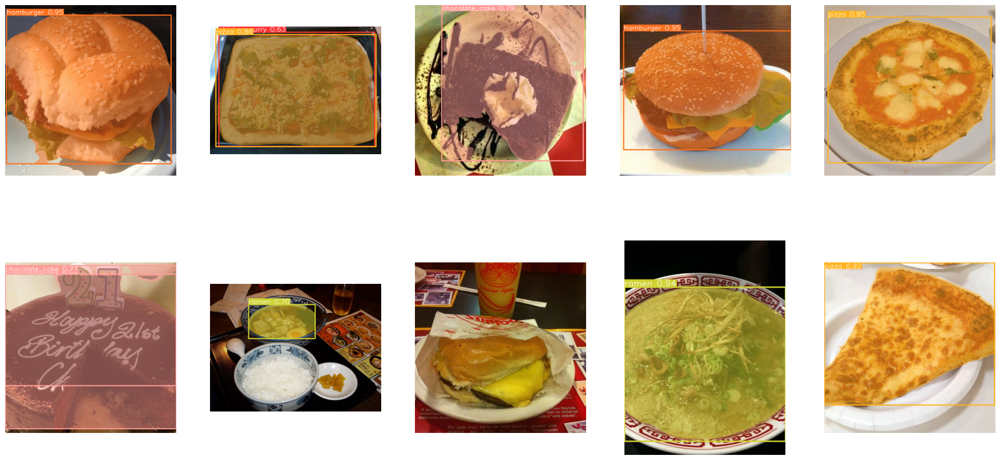

In [22]:
# Predicting and visualizing the model
predict_and_visualize(model_path=exp2_best_model_path,
                      test_dirpath=val_imgs_path,
                      conf=0.5)

#### Last Model Results

In [23]:
exp2_last_model_path = 'train_logs_5class_10percent/exp2_yolov8s_5class_10percent/weights/last.pt'

In [24]:
# Validating the best model on the val dataset for this experiment
model = YOLO(exp2_last_model_path)
metrics = model.val(name='exp2_last_model')

Ultralytics YOLOv8.0.92 🚀 Python-3.9.16 torch-1.12.1+cu116 CUDA:0 (Quadro P5000, 16279MiB)
YOLOv8s-seg summary (fused): 195 layers, 11781535 parameters, 0 gradients, 42.4 GFLOPs
val: Scanning /notebooks/datasets/labels/val/chicken_curry.cache... 121 images, 0 backgrounds, 0 corrupt: 100%|██████████| 121/121 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.78it/s]
                   all        121        122      0.877      0.842      0.891      0.731      0.887      0.847       0.89      0.711
         chicken_curry        121         24      0.865      0.799      0.885      0.694      0.861      0.792      0.846      0.662
        chocolate_cake        121         24      0.859      0.764      0.829      0.656      0.859      0.762      0.822      0.616
             hamburger        121         23      0.947      0.778      0.864      0.627       


0: 512x512 1 pizza, 10.9ms
Speed: 1.1ms preprocess, 10.9ms inference, 2.1ms postprocess per image at shape (1, 3, 512, 512)

0: 352x512 1 pizza, 18.0ms
Speed: 1.1ms preprocess, 18.0ms inference, 1.9ms postprocess per image at shape (1, 3, 512, 512)

0: 352x512 2 chicken_currys, 1 hamburger, 13.3ms
Speed: 3.2ms preprocess, 13.3ms inference, 2.2ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 (no detections), 12.7ms
Speed: 1.0ms preprocess, 12.7ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)

0: 384x512 1 pizza, 13.3ms
Speed: 1.0ms preprocess, 13.3ms inference, 2.3ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 (no detections), 15.6ms
Speed: 1.2ms preprocess, 15.6ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 1 pizza, 14.5ms
Speed: 1.1ms preprocess, 14.5ms inference, 2.5ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 1 chicken_curry, 12.7ms
Speed: 1.1ms preprocess, 12.7ms inference, 2.3ms po

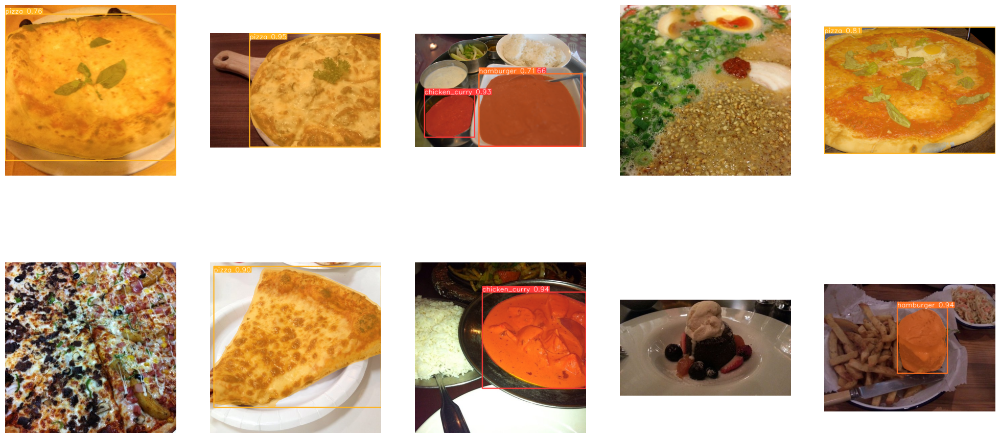

In [25]:
# Predicting and visualizing the model
predict_and_visualize(model_path=exp2_last_model_path,
                      test_dirpath=val_imgs_path,
                      conf=0.5)

### Experiment No. 3 - Yolov8 Medium Model

#### Best Model Results

In [26]:
exp3_best_model_path = 'train_logs_5class_10percent/exp3_yolov8m_5class_10percent/weights/best.pt'

In [27]:
# Validating the best model on the val dataset for this experiment
model = YOLO(exp3_best_model_path)
metrics = model.val(name='exp3_best_model')

Ultralytics YOLOv8.0.92 🚀 Python-3.9.16 torch-1.12.1+cu116 CUDA:0 (Quadro P5000, 16279MiB)
YOLOv8m-seg summary (fused): 245 layers, 27225279 parameters, 0 gradients, 110.0 GFLOPs
val: Scanning /notebooks/datasets/labels/val/chicken_curry.cache... 121 images, 0 backgrounds, 0 corrupt: 100%|██████████| 121/121 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:05<00:00,  1.58it/s]
                   all        121        122        0.8      0.845      0.907      0.737      0.793      0.837      0.895        0.7
         chicken_curry        121         24      0.726      0.663      0.851       0.72      0.726      0.663      0.851      0.639
        chocolate_cake        121         24      0.704      0.917      0.895      0.706      0.672      0.875      0.846      0.628
             hamburger        121         23      0.775      0.957      0.945      0.662      


0: 512x512 1 pizza, 14.8ms
Speed: 1.2ms preprocess, 14.8ms inference, 2.3ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 1 hamburger, 16.7ms
Speed: 1.3ms preprocess, 16.7ms inference, 2.4ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 1 chocolate_cake, 15.6ms
Speed: 1.2ms preprocess, 15.6ms inference, 2.5ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 1 hamburger, 15.8ms
Speed: 1.6ms preprocess, 15.8ms inference, 2.8ms postprocess per image at shape (1, 3, 512, 512)

0: 352x512 1 pizza, 23.8ms
Speed: 1.1ms preprocess, 23.8ms inference, 2.3ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 1 ramen, 16.4ms
Speed: 1.1ms preprocess, 16.4ms inference, 2.4ms postprocess per image at shape (1, 3, 512, 512)

0: 352x512 1 pizza, 17.9ms
Speed: 1.5ms preprocess, 17.9ms inference, 2.3ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 1 pizza, 15.7ms
Speed: 1.3ms preprocess, 15.7ms inference, 2.2ms postprocess per image at shape 

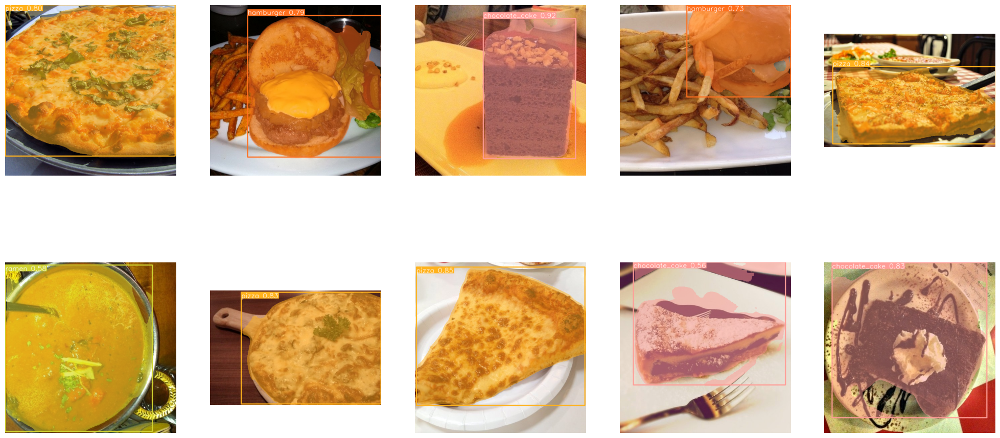

In [28]:
# Predicting and visualizing the model
predict_and_visualize(model_path=exp3_best_model_path,
                      test_dirpath=val_imgs_path,
                      conf=0.5)

#### Last Model Results

In [29]:
exp3_last_model_path = 'train_logs_5class_10percent/exp3_yolov8m_5class_10percent/weights/last.pt'

In [30]:
# Validating the best model on the val dataset for this experiment
model = YOLO(exp3_last_model_path)
metrics = model.val(name='exp3_last_model')

Ultralytics YOLOv8.0.92 🚀 Python-3.9.16 torch-1.12.1+cu116 CUDA:0 (Quadro P5000, 16279MiB)
YOLOv8m-seg summary (fused): 245 layers, 27225279 parameters, 0 gradients, 110.0 GFLOPs
val: Scanning /notebooks/datasets/labels/val/chicken_curry.cache... 121 images, 0 backgrounds, 0 corrupt: 100%|██████████| 121/121 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:05<00:00,  1.57it/s]
                   all        121        122      0.801      0.819      0.885      0.724      0.811      0.827      0.876      0.698
         chicken_curry        121         24      0.846      0.685      0.862      0.731      0.846      0.685      0.865      0.725
        chocolate_cake        121         24      0.776      0.865       0.86      0.667      0.775      0.864      0.821      0.568
             hamburger        121         23      0.813      0.739      0.881      0.614      


0: 512x512 1 pizza, 15.7ms
Speed: 1.4ms preprocess, 15.7ms inference, 2.7ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 1 hamburger, 19.3ms
Speed: 1.6ms preprocess, 19.3ms inference, 2.8ms postprocess per image at shape (1, 3, 512, 512)

0: 288x512 (no detections), 27.5ms
Speed: 1.2ms preprocess, 27.5ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)

0: 384x512 1 chocolate_cake, 27.1ms
Speed: 1.4ms preprocess, 27.1ms inference, 2.9ms postprocess per image at shape (1, 3, 512, 512)

0: 512x384 1 pizza, 27.2ms
Speed: 1.8ms preprocess, 27.2ms inference, 2.2ms postprocess per image at shape (1, 3, 512, 512)

0: 384x512 1 hamburger, 17.9ms
Speed: 0.9ms preprocess, 17.9ms inference, 2.3ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 1 chocolate_cake, 17.0ms
Speed: 1.5ms preprocess, 17.0ms inference, 2.3ms postprocess per image at shape (1, 3, 512, 512)

0: 384x512 1 hamburger, 17.7ms
Speed: 0.9ms preprocess, 17.7ms inference, 2.2ms postproces

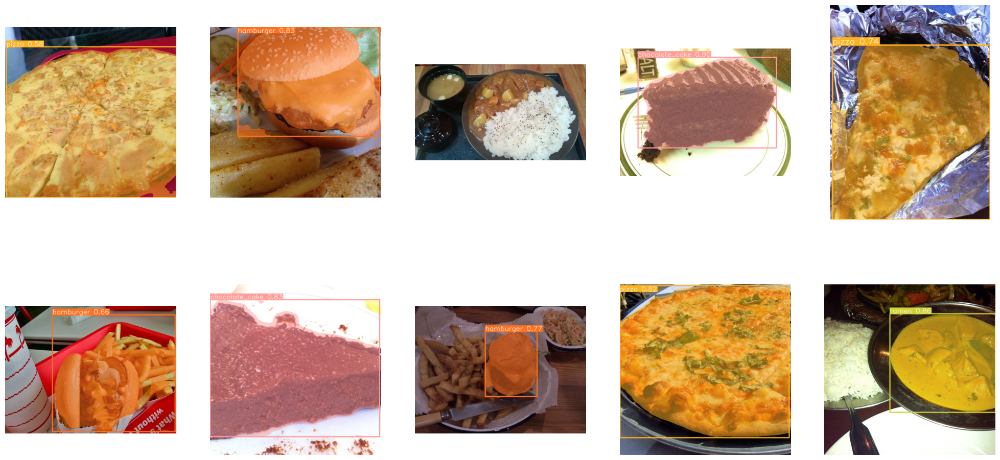

In [31]:
# Predicting and visualizing the model
predict_and_visualize(model_path=exp3_last_model_path,
                      test_dirpath=val_imgs_path,
                      conf=0.5)